In [1]:
%load_ext blackcellmagic
%load_ext autoreload
%autoreload 2

In [2]:
import tensorflow as tf
import numpy as np
import altair as alt
print(f"tensorflow: {tf.__version__}")
print(f"keras: {tf.keras.__version__}")

tensorflow: 2.0.0-beta1
keras: 2.2.4-tf


#### Load data
Extract all samples for the cell types {VCAP, MCF7, PC3} to train the model. Normalize the data using the standard scale.

In [3]:
from deep_lincs.dataset import Dataset

cell_ids = ["MCF7", "VCAP", "PC3"]
pert_types = ["trt_cp", "ctl_vehicle", "ctl_untrt"]
dataset = Dataset.from_yaml("settings.yaml", cell_id=cell_ids, pert_type=pert_types)
dataset.normalize_by_gene("standard_scale")
dataset

<L1000 Dataset: (samples: 333,523, genes: 978)>

#### Create Autoencoder
Initialize an autoencoder and prepare dataset for training and evaluation.

In [4]:
from deep_lincs.models import AutoEncoder

tf.random.set_seed(42)
np.random.seed(42)

ae = AutoEncoder(dataset)
ae.prepare_tf_datasets(batch_size=64)

W0728 23:53:45.485571 139837784905536 deprecation.py:323] From /Users/manz01/miniconda3/envs/lincs-gpu/lib/python3.6/site-packages/tensorflow/python/data/util/random_seed.py:58: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Compile and build the model.

In [5]:
h_size = 32
ae.compile_model([128, h_size, 128], dropout_rate=0.2)
ae.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 978)]             0         
_________________________________________________________________
dropout (Dropout)            (None, 978)               0         
_________________________________________________________________
dense (Dense)                (None, 128)               125312    
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
hidden_embedding (Dense)     (None, 32)                4128      
_________________________________________________________________
dropout_2 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               4224  

Train model.

In [6]:
ae.fit(epochs=10)

Epoch 1/10
3335/3335 [==============================] - 17s 5ms/step - loss: 0.0103 - cosine_similarity: 0.9847 - pearsons_corrcoef: 0.8544 - val_loss: 0.0069 - val_cosine_similarity: 0.9894 - val_pearsons_corrcoef: 0.8908
Epoch 2/10
3335/3335 [==============================] - 15s 4ms/step - loss: 0.0074 - cosine_similarity: 0.9886 - pearsons_corrcoef: 0.8763 - val_loss: 0.0068 - val_cosine_similarity: 0.9896 - val_pearsons_corrcoef: 0.8943
Epoch 3/10
3335/3335 [==============================] - 15s 4ms/step - loss: 0.0070 - cosine_similarity: 0.9890 - pearsons_corrcoef: 0.8536 - val_loss: 0.0068 - val_cosine_similarity: 0.9895 - val_pearsons_corrcoef: 0.8930
Epoch 4/10
3335/3335 [==============================] - 14s 4ms/step - loss: 0.0068 - cosine_similarity: 0.9892 - pearsons_corrcoef: 0.8513 - val_loss: 0.0067 - val_cosine_similarity: 0.9895 - val_pearsons_corrcoef: 0.8931
Epoch 5/10
3335/3335 [==============================] - 15s 4ms/step - loss: 0.0068 - cosine_similarity: 0.9

Evalaute model.

In [7]:
test_loss = ae.evaluate()
print(f"loss: {test_loss}")

1043/1043 [==============================] - 2s 2ms/step - loss: 0.0067 - cosine_similarity: 0.9896 - pearsons_corrcoef: 0.8822
loss: [0.0066618204191827134, 0.98961955, 0.8822035]


## Examine latent representation
Here we use the `HiddenEmbedding` class to examine hidden activations. 

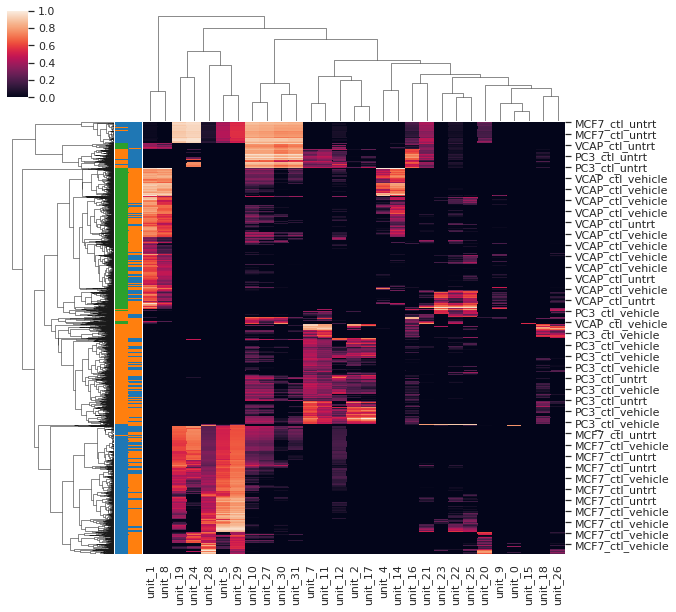

In [8]:
from deep_lincs.hidden_embedding import HiddenEmbedding
# Extract control samples from testing data
test_ctrl_data = ae.test.filter_rows(pert_type=["ctl_vehicle", "ctl_untrt"])

he = HiddenEmbedding(test_ctrl_data, ae.encoder)
he.plot_clustermap(meta_colnames=["cell_id", "pert_type"])

### Zero-out method
The zero-out method is used to explore the relationship between genes and hidden unit activations. 
The method works as follows:
    
- Each gene in each sample is set to zero and the resulting expression profile is used as input to the encoder.
- The squared difference between the hidden unit activations are taken for each zeroed-out sample.
- This creates a tensor `(n_samples, n_genes, n_hidden_units)` which is filled with the squared difference between the predicted activation for `sample_x`, `gene_x`, `unit_x` after `gene_x` is set to zero.
- For each sample and each unit, the top-k genes with the largest squared difference are extracted, and the results are returned as a dataframe with columns: `sample_id`, `unit`, `gene_id` and `k_rank`.
- From here, we can count the occurance of each `gene_id` for a `k_rank` threshold and see which genes influence each unit. 
- This can be combined with other metadata with `HiddenEmbedding.plot_unit_counts()`, allowing the user to visualise if a unit is specific to a metadata field.

In [9]:
# Zero out each gene for each sample and examine difference in hidden output
he.zero_out_genes()

Selecting the units we observe cell-specific ativation in (cluster map), we find genes which are associated to these cells.

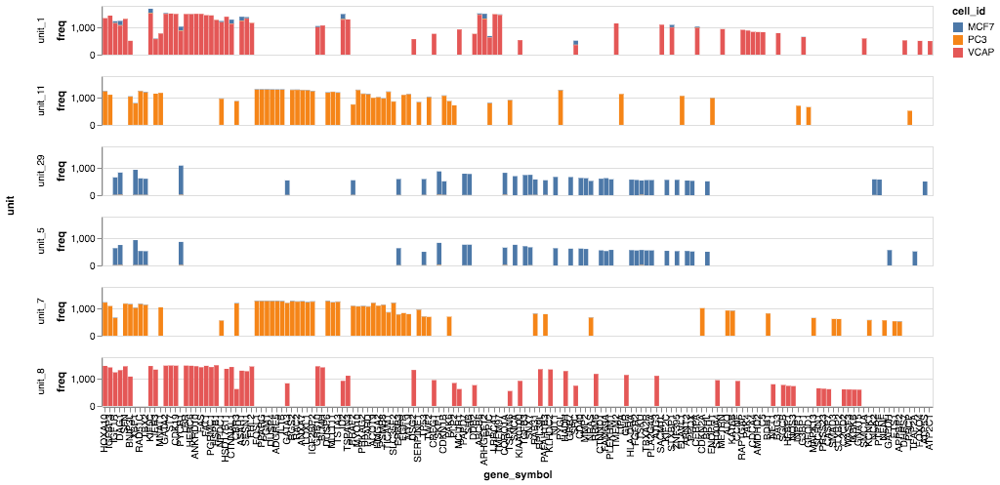

In [24]:
selected_units = [1,8,29,5,7,11] # selected units from clustermap
he.plot_unit_counts("cell_id", units=selected_units, count_thresh=500, k_max=50)

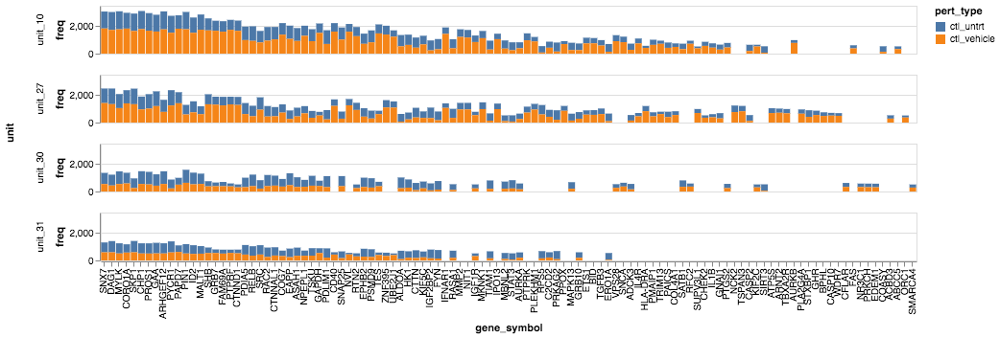

In [25]:
he.plot_unit_counts("pert_type", units=[10, 27, 30, 31], count_thresh=500, k_max=50)

We can also plot difference embeddings of the hidden representation using various dimentionality techniques.

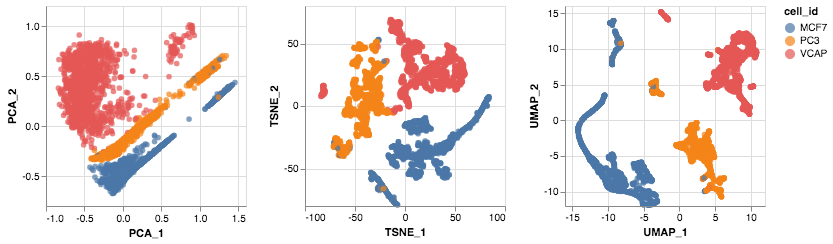

In [26]:
# compare with embedding projections
embedding_plots = [he.plot_embedding(e, color="cell_id").properties(width=200, height=200) for e in ["PCA", "TSNE", "UMAP"]]
alt.hconcat(*embedding_plots)

Using the same units as above, we can select the genes from these units which are unqiue to our samples and run a gene-expression analysis.

In [27]:
genes_by_unit = he.get_genes_by_unit("cell_id", units=selected_units, count_thresh=200, k_max=20)

In [28]:
from functools import partial
def get_geneset(genes_by_unit, tup):
    unit_num, key = tup
    glist = genes_by_unit[f"unit_{unit_num}"][key]
    return set(glist)
set_lookup = partial(get_geneset, genes_by_unit)

In [29]:
def get_unique_lists(genes_by_unit, key, units):
    unit_lists = [genes_by_unit[f"unit_{unit}"][key] for unit in units]
    combined_set = set([item for sublist in unit_lists for item in sublist])
    return combined_set

In [30]:
lookup_units = {
    "MCF7": [29,5],
    "PC3": [7,11],
    "VCAP": [8,1]
}
mcf7, pc3, vcap = [get_unique_lists(genes_by_unit, cell_id, units) for cell_id, units in lookup_units.items()]

#### Gene set analysis

In [31]:
from deep_lincs.enrichr import EnrichrQuery
databases = ["GO_Biological_Process_2017b", "MSigDB_Oncogenic_Signatures", "KEGG_2015"]

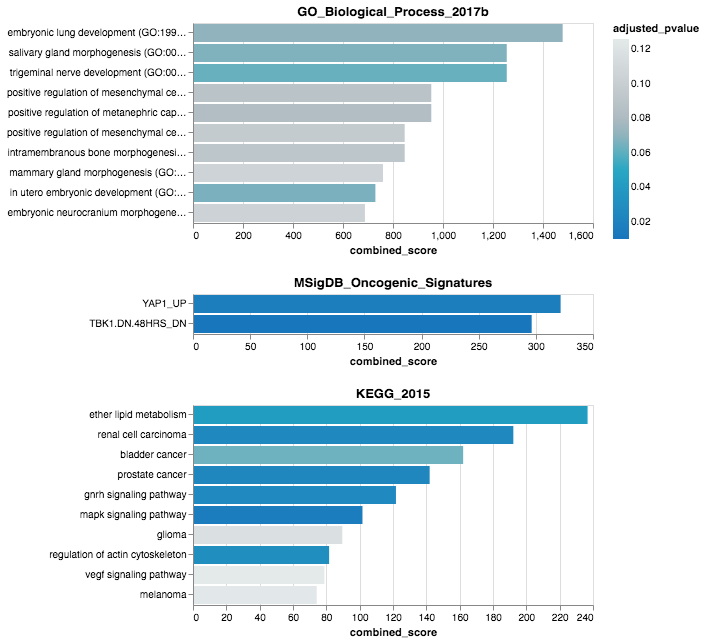

In [32]:
enr = EnrichrQuery(
    gene_list=list(mcf7 - vcap - pc3),
    description=f"Genes activating for MCF7.",
)
enr.enrich(databases)
enr.plot(size=10, pvalue_thresh=0.2)

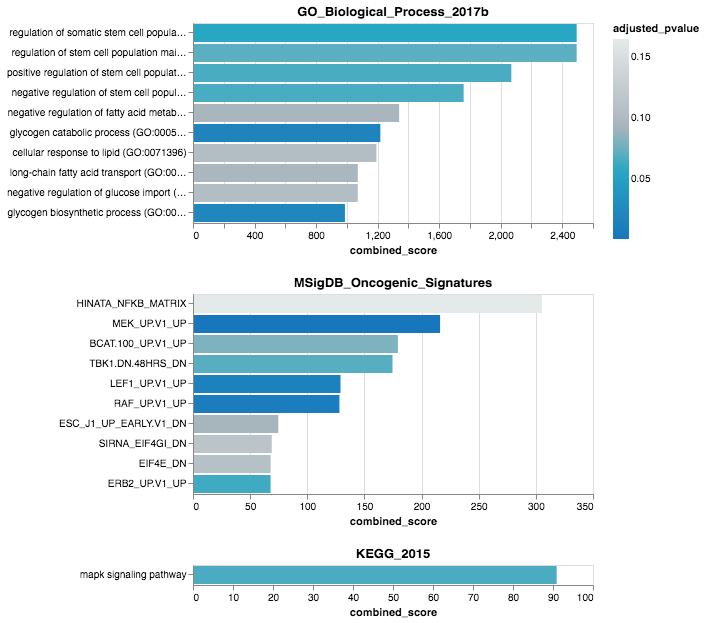

In [33]:
enr = EnrichrQuery(
    gene_list=list(pc3 - mcf7 - vcap),
    description=f"Genes activating for PC3.",
)
enr.enrich(databases)
enr.plot(size=10, pvalue_thresh=0.2)

/Users/manz01/miniconda3/envs/lincs-gpu/lib/python3.6/site-packages/altair/utils/core.py:90: UserWarning: I don't know how to infer vegalite type from 'empty'.  Defaulting to nominal.
  "Defaulting to nominal.".format(typ))


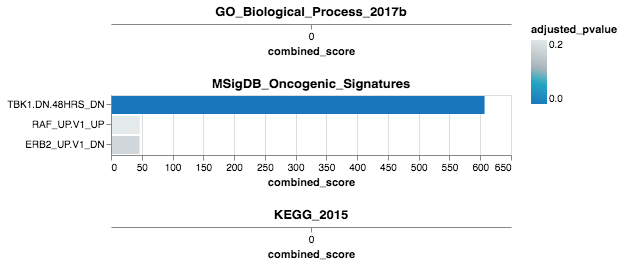

In [34]:
enr = EnrichrQuery(
    gene_list=list(vcap - pc3 - mcf7),
    description=f"Genes activating for VCAP.",
)
enr.enrich(databases)
enr.plot(size=10, pvalue_thresh=0.2)